In [ ]:
!pip install livelossplot

In [26]:
import os
import cv2
import tarfile
import numpy as np
from urllib import request
import pathlib
from matplotlib import pyplot as plt
from skimage import metrics
import keras
from keras.applications import VGG16
import tensorflow as tf
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from livelossplot.inputs.keras import PlotLossesCallback

### Preprocessing

In [438]:
IS_COLAB = 'google.colab' in str(get_ipython())
IS_COLAB

False

In [2]:
base_path = f"{'/' if IS_COLAB else ''}content/sample_data/images"

personA = "Chris_Hemsworth"
personB = "Katy_Perry"
personC = "Bradley_Cooper"
personD = "Zooey_Deschanel"

training_people = [personA, personB]
testing_people = [personC, personD]
people = training_people + testing_people

if not os.path.isdir(base_path):
    os.makedirs(base_path)

vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
    f.write(r.read())

with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
    f.extractall(os.path.join(base_path))

face_classifier = cv2.CascadeClassifier(os.path.join(cv2.data.haarcascades, "haarcascade_frontalface_default.xml"))

all_subjects = [
    subject for subject in sorted(os.listdir(os.path.join(base_path, "vgg_face_dataset", "files"))) if
    subject.endswith(".txt") and subject[:-4] in people]

all_subjects

['Bradley_Cooper.txt',
 'Chris_Hemsworth.txt',
 'Katy_Perry.txt',
 'Zooey_Deschanel.txt']

In [3]:
# Print iterations progress
def printProgressBar(iteration, total, prefix='', suffix='', decimals=1, length=100, fill='█', printEnd="\r"):
    """
    Call in a loop to create terminal progress bar
    @params:
        iteration   - Required  : current iteration (Int)
        total       - Required  : total iterations (Int)
        prefix      - Optional  : prefix string (Str)
        suffix      - Optional  : suffix string (Str)
        decimals    - Optional  : positive number of decimals in percent complete (Int)
        length      - Optional  : character length of bar (Int)
        fill        - Optional  : bar fill character (Str)
        printEnd    - Optional  : end character (e.g. "\r", "\r\n") (Str)
    """
    percent = ("{0:." + str(decimals) + "f}").format(100 * (iteration / float(total)))
    filledLength = int(length * iteration // total)
    bar = fill * filledLength + '-' * (length - filledLength)
    print(f'\r{prefix} |{bar}| {percent}% {suffix}', end=printEnd)
    # Print New Line on Complete
    if iteration == total:
        print()

In [4]:
def get_images(people: list[str], amount_of_images_per_subject=30, min_sim_score=0.45):
    images = []
    for subject in people:
        with open(os.path.join(base_path, "vgg_face_dataset", "files", f"{subject}.txt"), 'r') as f:
            lines = f.readlines()

        images_ = []
        for line in lines:
            url = line[line.find("http://"): line.find(".jpg") + 4]

            try:
                res = request.urlopen(url, timeout=1)
                img = np.asarray(bytearray(res.read()), dtype="uint8")
                img = cv2.imdecode(img, cv2.IMREAD_COLOR)
                if img is None:
                    continue

                img_ = img.copy()
                img_gray = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
                faces = face_classifier.detectMultiScale(
                    img_gray,
                    scaleFactor=1.2,
                    minNeighbors=5,
                    minSize=(30, 30),
                    flags=cv2.CASCADE_SCALE_IMAGE
                )
                if len(faces) != 1:
                    continue

                (x, y, w, h) = faces[0]
                cropped_img = img[y:y + h, x:x + w]

                # do a similarity check on the existing images and only add the image if it is not too similar to the existing ones
                # similarity check is done by using the structural similarity index (SSIM)
                img_exists = False
                for existing_img in images_:
                    img_copy = cv2.resize(cropped_img, (existing_img.shape[1], existing_img.shape[0]),
                                          interpolation=cv2.INTER_AREA)
                    img1 = cv2.cvtColor(img_copy, cv2.COLOR_BGR2GRAY)
                    img2 = cv2.cvtColor(existing_img, cv2.COLOR_BGR2GRAY)

                    ssim_score = metrics.structural_similarity(img1, img2, full=True)
                    if ssim_score[0] > min_sim_score:
                        img_exists = True
                        break
                if img_exists:
                    continue
                images_.append(cropped_img)
                printProgressBar(len(images_), amount_of_images_per_subject, prefix=f"Subject {subject}",
                                 suffix="Complete",
                                 length=50)

            except:
                pass

            if len(images_) == amount_of_images_per_subject:
                images.append(images_)
                break
    return images

In [5]:
amount_of_subjects = 2
amount_of_images_per_subject = 30
training_images = get_images(training_people, amount_of_images_per_subject)

Subject Chris_Hemsw |██████████████████████████████████████████████████| 100.0% Complete
Subject Katy_P |██████████████████████████████████████████████████| 100.0% Complete


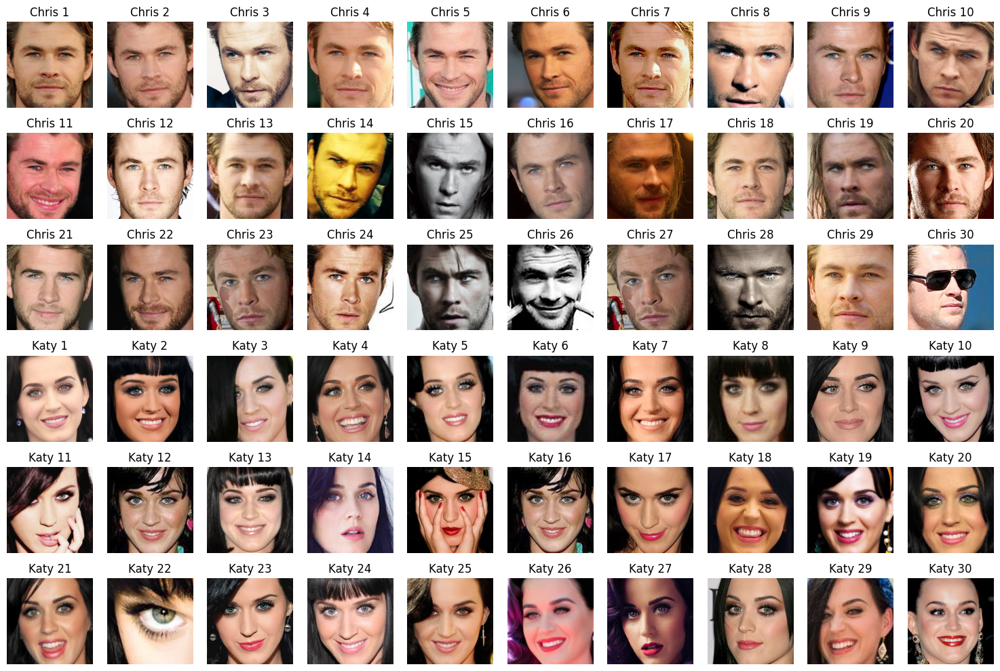

In [10]:
amount_of_images_per_subject = 30
plt.figure(figsize=(15, 10))
for idx, subject in enumerate(training_people):
    for i, img in enumerate(training_images[idx]):
        ax = plt.subplot(amount_of_subjects * 3, amount_of_images_per_subject // 3,
                         idx * amount_of_images_per_subject + i + 1)
        plt.title(f'{subject[:subject.find("_")]} {i + 1}')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.tight_layout()
plt.show()

In [7]:
amount_of_images_per_subject = 10
testing_images = get_images(testing_people, amount_of_images_per_subject, min_sim_score=0.35)

Subject Bradley_Co |██████████████████████████████████████████████████| 100.0% Complete
Subject Zooey_Desch |██████████████████████████████████████████████████| 100.0% Complete


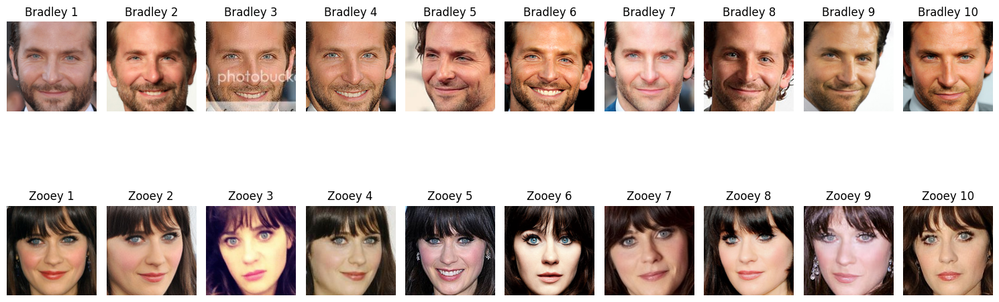

In [11]:
amount_of_images_per_subject = 10
plt.figure(figsize=(15, 10))
for idx, subject in enumerate(testing_people):
    for i, img in enumerate(testing_images[idx]):
        ax = plt.subplot(amount_of_subjects, amount_of_images_per_subject,
                         idx * amount_of_images_per_subject + i + 1)
        plt.title(f'{subject[:subject.find("_")]} {i + 1}')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.tight_layout()

In [317]:
# save the cropped images to a folder called training_data
resized_images = np.array([cv2.resize(image, (224, 224)) for image in training_images[0] + training_images[1]])
amount_of_images_per_subject = 30
for i, image in enumerate(resized_images):
    sub_folder = 'male' if i < amount_of_images_per_subject else 'female'
    if not os.path.exists(f'training_data/{sub_folder}'):
        os.makedirs(f'training_data/{sub_folder}')
    cv2.imwrite(
        f'training_data/{sub_folder}/image_{i if i < amount_of_images_per_subject else i - amount_of_images_per_subject}.jpg',
        cv2.cvtColor(image, cv2.IMREAD_COLOR))

In [318]:
resized_images = np.array([cv2.resize(image, (224, 224)) for image in testing_images[0] + testing_images[1]])

amount_of_images_per_subject = 10
for i, image in enumerate(resized_images):
    sub_folder = 'male' if i < amount_of_images_per_subject else 'female'
    if not os.path.exists(f'testing_data/{sub_folder}'):
        os.makedirs(f'testing_data/{sub_folder}')
    cv2.imwrite(
        f'testing_data/{sub_folder}/image_{i if i < amount_of_images_per_subject else i - amount_of_images_per_subject}.jpg',
        cv2.cvtColor(image, cv2.IMREAD_COLOR))

### Loading the data

In [391]:
data_dir = pathlib.Path('training_data').with_suffix('')
[train_ds, val_ds] = keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),
    validation_split=1 / 3,
    subset="both",
    class_names=['male', 'female'],
    seed=69)

Found 60 files belonging to 2 classes.
Using 40 files for training.
Using 20 files for validation.


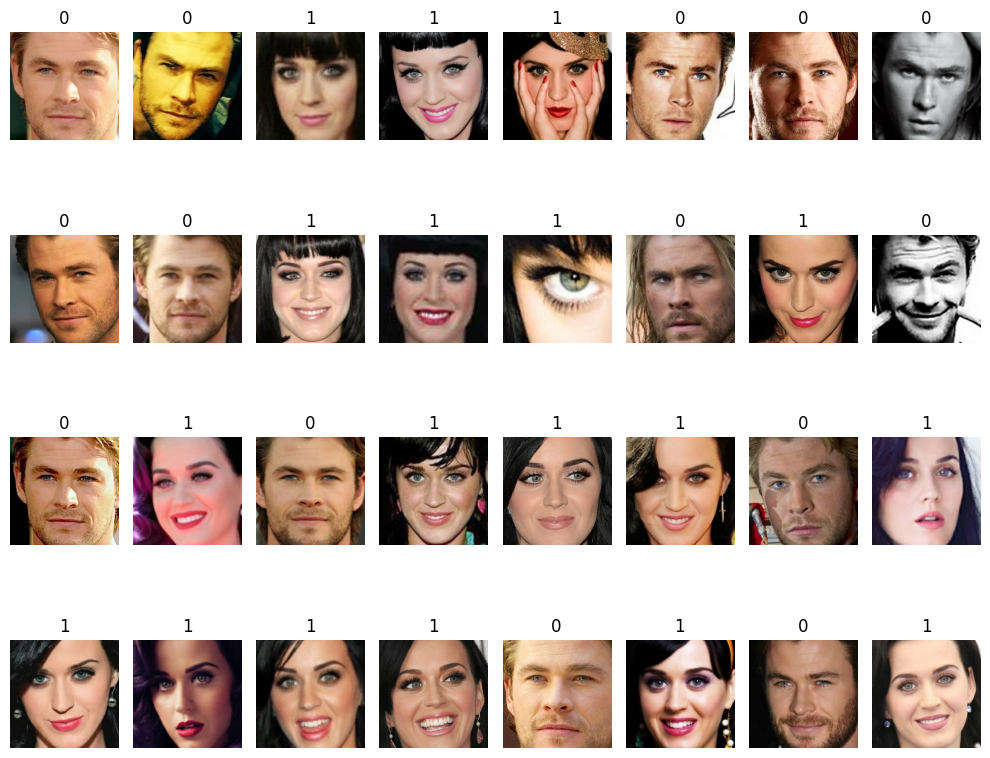

In [392]:
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(images):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(image.numpy().astype("int32"))
        plt.title(str(int(labels[i])))
        plt.axis("off")
        plt.tight_layout()

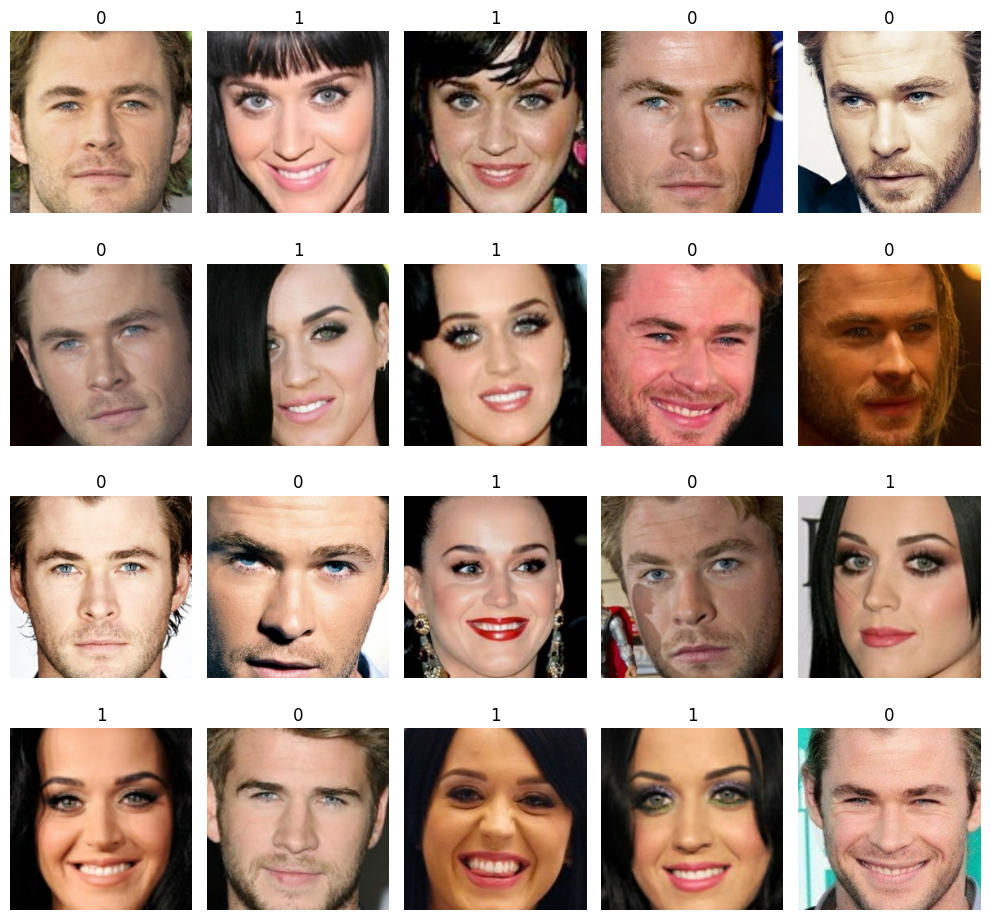

In [393]:
for images, labels in val_ds.take(1):
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(images):
        ax = plt.subplot(4, 5, i + 1)
        plt.imshow(image.numpy().astype("int32"))
        plt.title(str(int(labels[i])))
        plt.axis("off")
        plt.tight_layout()

In [394]:
data_dir = pathlib.Path('testing_data').with_suffix('')
test_ds = keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),
    class_names=['male', 'female'])

Found 20 files belonging to 2 classes.


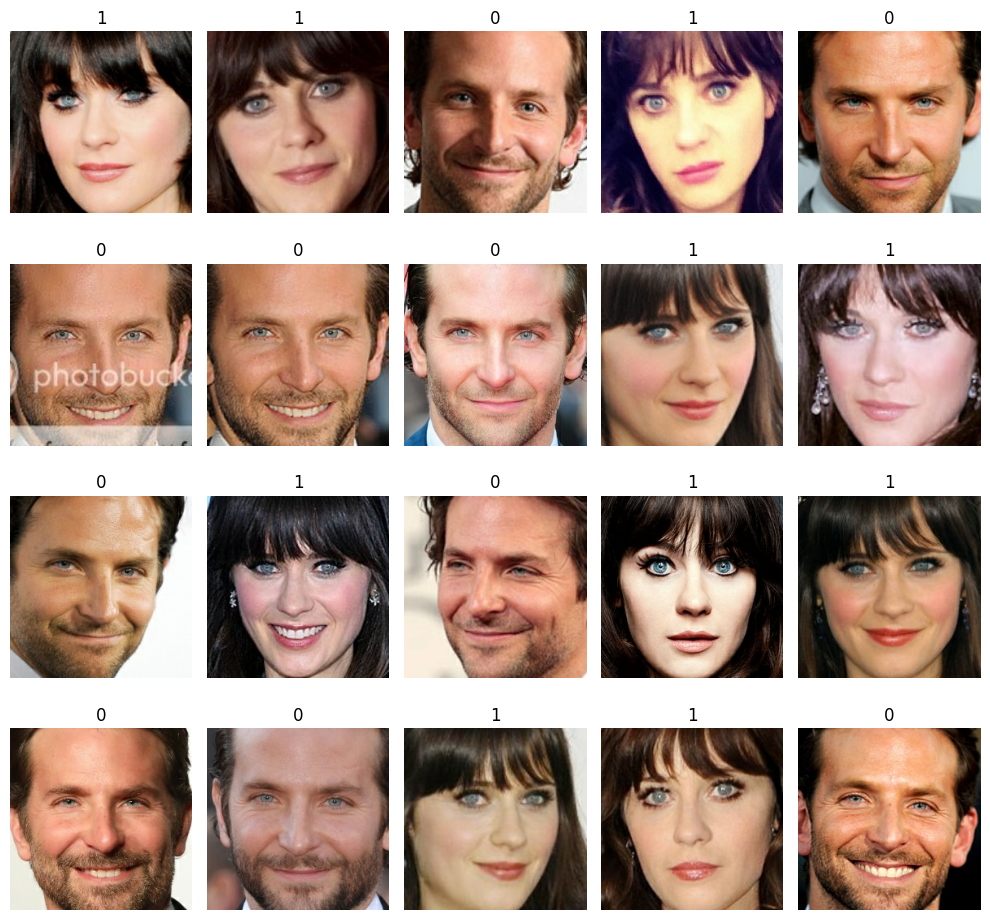

In [395]:
for images, labels in test_ds.take(1):
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(images):
        ax = plt.subplot(4, 5, i + 1)
        plt.imshow(image.numpy().astype("int32"))
        plt.title(str(int(labels[i])))
        plt.axis("off")
        plt.tight_layout()

### Loading the model

In [397]:
def create_model(augment_data=False, rescale_images=False):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False

    inputs = keras.Input(shape=(224, 224, 3))

    data_augmentation = keras.Sequential([keras.layers.RandomFlip('horizontal'),
                                          keras.layers.RandomRotation(0.1)], name='augmentation')
    scale_layer = keras.layers.Rescaling(scale=1 / 127.5, offset=-1)

    x = inputs
    if augment_data:
        x = data_augmentation(x)
    if rescale_images:
        x = scale_layer(x)

    x = base_model(x, training=False)
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Flatten()(x)
    x = keras.layers.Dense(32, activation='relu')(x)
    x = keras.layers.Dense(16, activation='relu')(x)
    x = keras.layers.Dropout(0.5)(x)

    outputs = keras.layers.Dense(1, activation='sigmoid')(x)
    model = keras.Model(inputs, outputs)
    model.compile(optimizer=keras.optimizers.legacy.Adam(),
                  loss=keras.losses.BinaryCrossentropy(),
                  metrics=[keras.metrics.BinaryAccuracy()])
    return model

In [415]:
results = []

##### Model #1

First we create a model without data_augmentation or rescaling.

In [404]:
model = create_model(augment_data=False, rescale_images=False)

In [405]:
model.summary()

Model: "model_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_84 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_3  (None, 512)               0         
 3 (GlobalAveragePooling2D)                                      
                                                                 
 flatten_17 (Flatten)        (None, 512)               0         
                                                                 
 dense_118 (Dense)           (None, 32)                16416     
                                                                 
 dense_119 (Dense)           (None, 16)                528       
                                                          

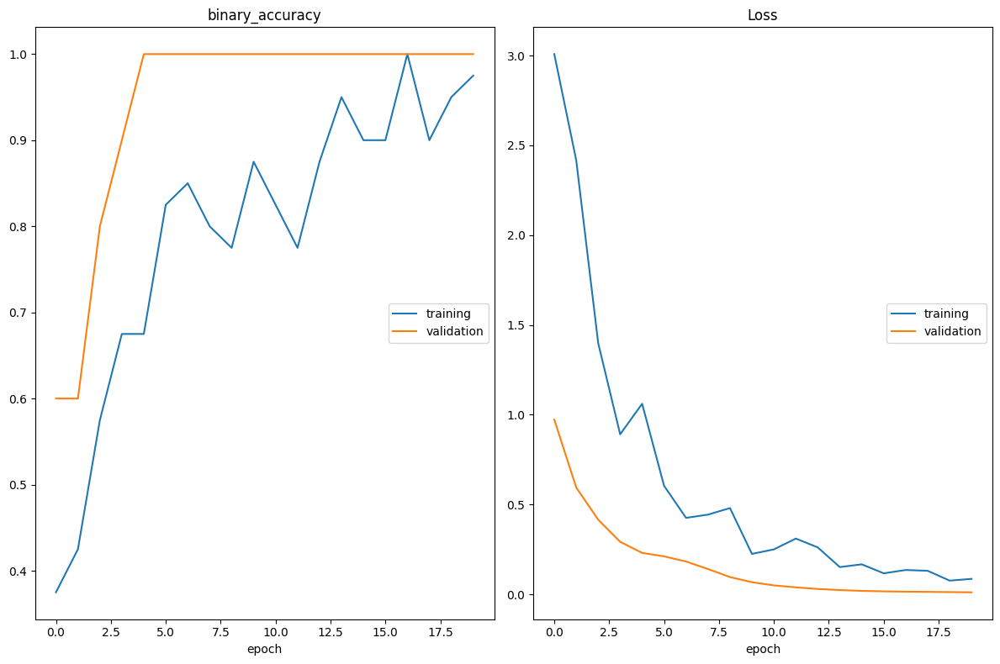

binary_accuracy
	training         	 (min:    0.375, max:    1.000, cur:    0.975)
	validation       	 (min:    0.600, max:    1.000, cur:    1.000)
Loss
	training         	 (min:    0.076, max:    3.008, cur:    0.086)
	validation       	 (min:    0.011, max:    0.973, cur:    0.011)
2/2 [==============================] - 14s 5s/step - loss: 0.0857 - binary_accuracy: 0.9750 - val_loss: 0.0109 - val_binary_accuracy: 1.0000


In [406]:
plot_loss = PlotLossesCallback()
model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[plot_loss])

In [416]:
result = model.evaluate(test_ds, return_dict=True)
results.append(result)
result

1/1 [==============================] - 4s 4s/step - loss: 0.1251 - binary_accuracy: 0.9500


{'loss': 0.1251193732023239, 'binary_accuracy': 0.949999988079071}

In [417]:
# display a confusion matrix
def display_confusion_matrix(model, data_set):
    classes = np.array(['male', 'female'])
    y_pred = []
    y_true = []
    for images, labels in data_set:
        for i, [image, label] in enumerate(zip(images, labels)):
            prediction = model.predict(np.array([image]))
            prediction_idx = 1 if prediction[0][0] > 0.5 else 0
            y_pred.append(prediction_idx)
            y_true.append(int(label))
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot()
    plt.show()

1/1 [==============================] - 0s 252ms/step


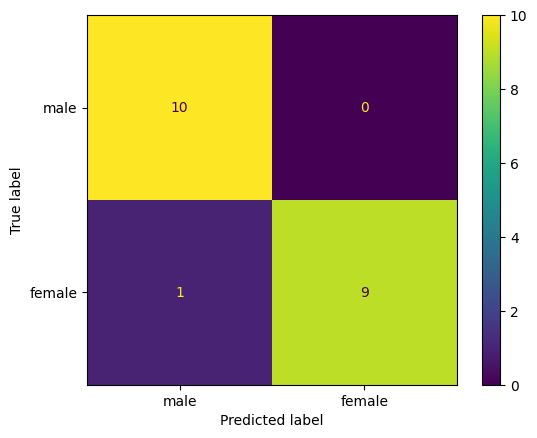

In [418]:
display_confusion_matrix(model, test_ds)

In [497]:
def show_predicted_vs_actual(model, data_set):
    classes = np.array(['male', 'female'])
    plt.figure(figsize=(15, 10))
    for images, labels in data_set:
        for i, [image, label] in enumerate(zip(images, labels)):
            prediction = model.predict(np.array([image]))
            ax = plt.subplot(5, 4, i + 1)
            plt.tight_layout()
            plt.imshow(image.numpy().astype("uint8"))
            prediction_idx = 1 if prediction[0][0] > 0.5 else 0
            plt.title(f'P: {classes[prediction_idx]} | A: {classes[int(label)]}')
            plt.axis("off")

1/1 [==============================] - 0s 196ms/step


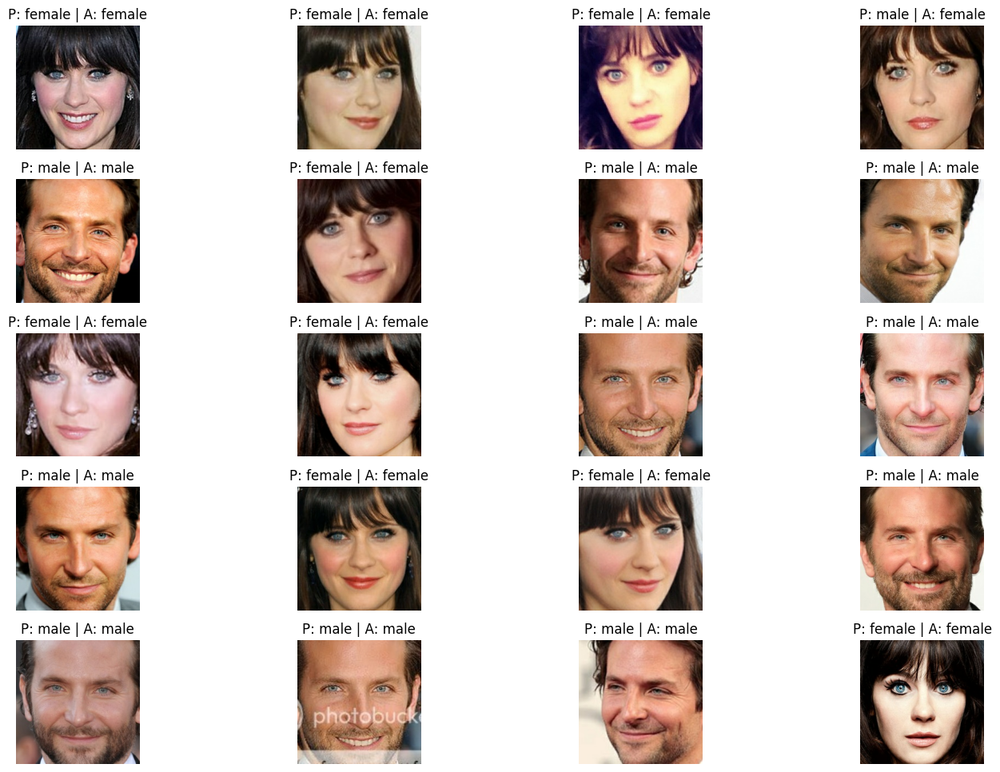

In [420]:
show_predicted_vs_actual(model, test_ds)

##### Model #2

In our second model we add a data augmentation layer which consists of random horizontal flips and random rotations.

In [421]:
model = create_model(augment_data=True, rescale_images=False)

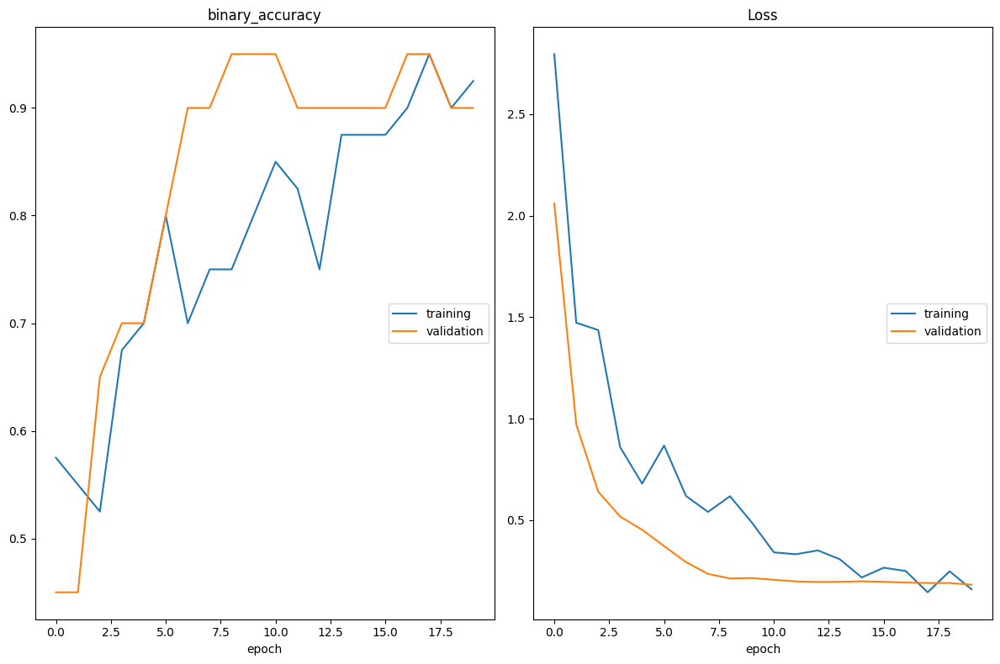

binary_accuracy
	training         	 (min:    0.525, max:    0.950, cur:    0.925)
	validation       	 (min:    0.450, max:    0.950, cur:    0.900)
Loss
	training         	 (min:    0.144, max:    2.796, cur:    0.159)
	validation       	 (min:    0.182, max:    2.060, cur:    0.182)
2/2 [==============================] - 9s 4s/step - loss: 0.1591 - binary_accuracy: 0.9250 - val_loss: 0.1817 - val_binary_accuracy: 0.9000


In [422]:
plot_loss = PlotLossesCallback()
model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[plot_loss])

In [423]:
result = model.evaluate(test_ds, return_dict=True)
results.append(result)
result

1/1 [==============================] - 4s 4s/step - loss: 0.3750 - binary_accuracy: 0.8500


{'loss': 0.37499338388442993, 'binary_accuracy': 0.8500000238418579}

1/1 [==============================] - 0s 171ms/step


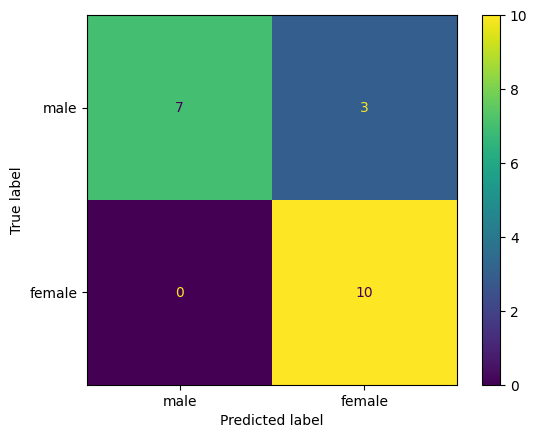

In [424]:
display_confusion_matrix(model, test_ds)

1/1 [==============================] - 0s 163ms/step


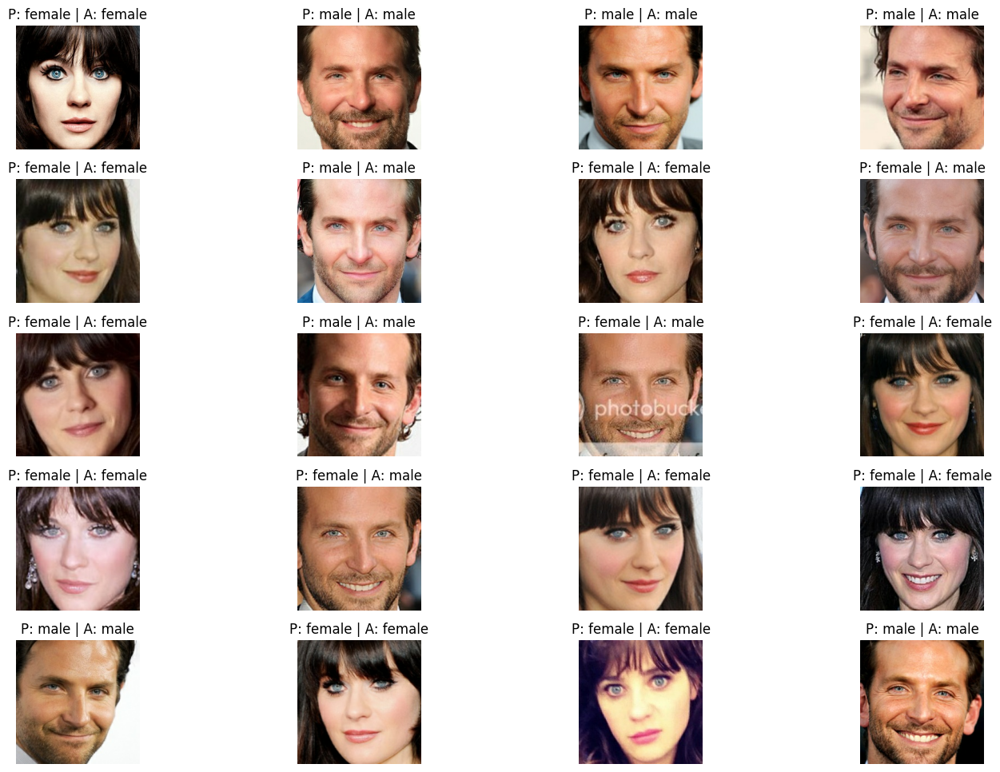

In [425]:
show_predicted_vs_actual(model, test_ds)

##### Model #3

This time we rescale the values of the images to between -1 and 1, because they are originally 0 to 255 and the idea is that the model can handle these rescaled values better. We remove the data augmentation again tho, to observe the impact of this single change alone.

In [426]:
model = create_model(augment_data=False, rescale_images=True)

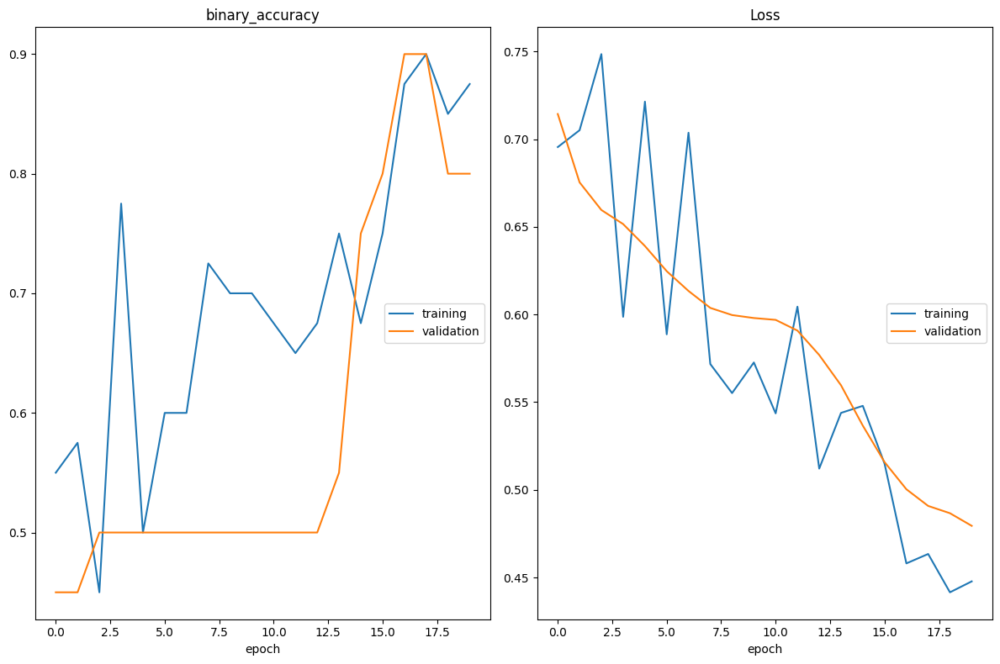

binary_accuracy
	training         	 (min:    0.450, max:    0.900, cur:    0.875)
	validation       	 (min:    0.450, max:    0.900, cur:    0.800)
Loss
	training         	 (min:    0.442, max:    0.749, cur:    0.448)
	validation       	 (min:    0.479, max:    0.714, cur:    0.479)
2/2 [==============================] - 9s 4s/step - loss: 0.4478 - binary_accuracy: 0.8750 - val_loss: 0.4794 - val_binary_accuracy: 0.8000


In [427]:
plot_loss = PlotLossesCallback()
model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[plot_loss])

In [428]:
result = model.evaluate(test_ds, return_dict=True)
results.append(result)
result

1/1 [==============================] - 3s 3s/step - loss: 0.5145 - binary_accuracy: 0.8500


{'loss': 0.5145062208175659, 'binary_accuracy': 0.8500000238418579}

1/1 [==============================] - 0s 160ms/step


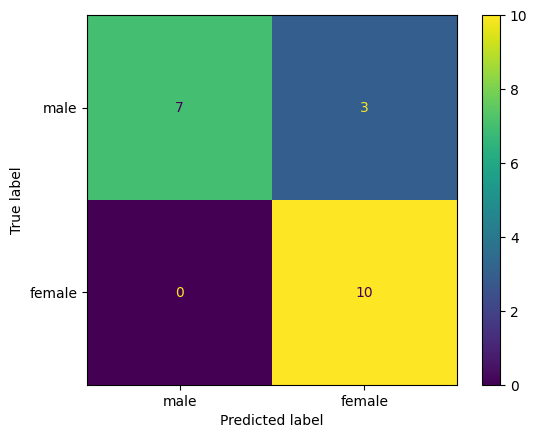

In [429]:
display_confusion_matrix(model, test_ds)

1/1 [==============================] - 0s 167ms/step


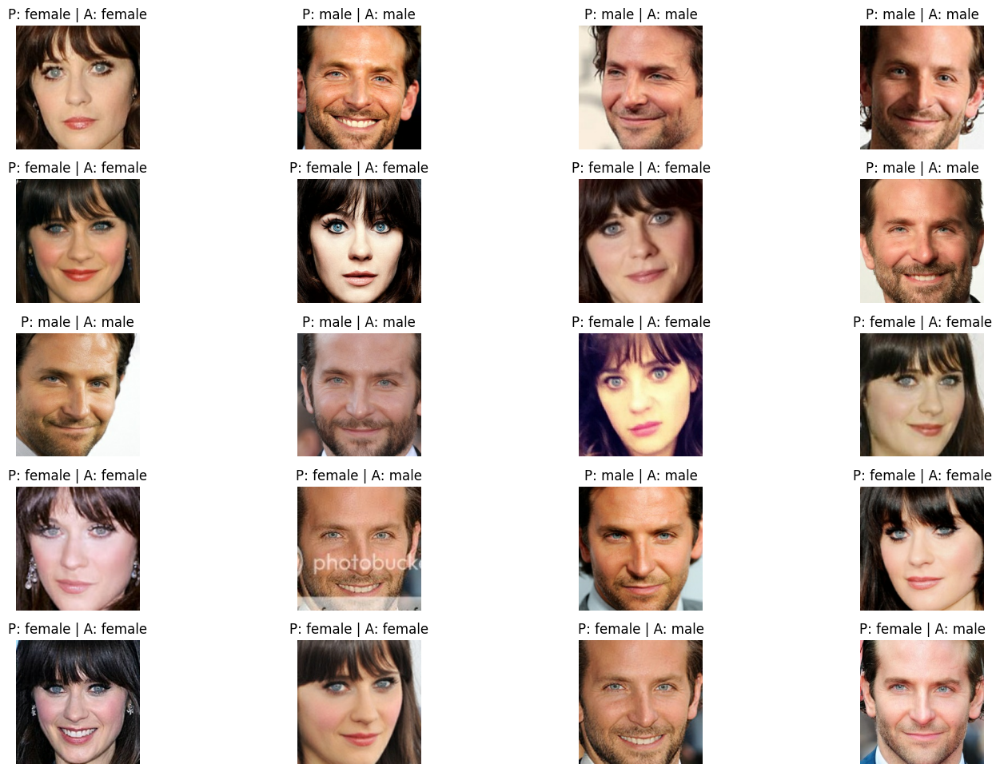

In [430]:
show_predicted_vs_actual(model, test_ds)

##### Model #4

In this final model we turn on both flags to rescale the image values and do some random data augmentation as in model #2.

In [431]:
model = create_model(augment_data=True, rescale_images=True)

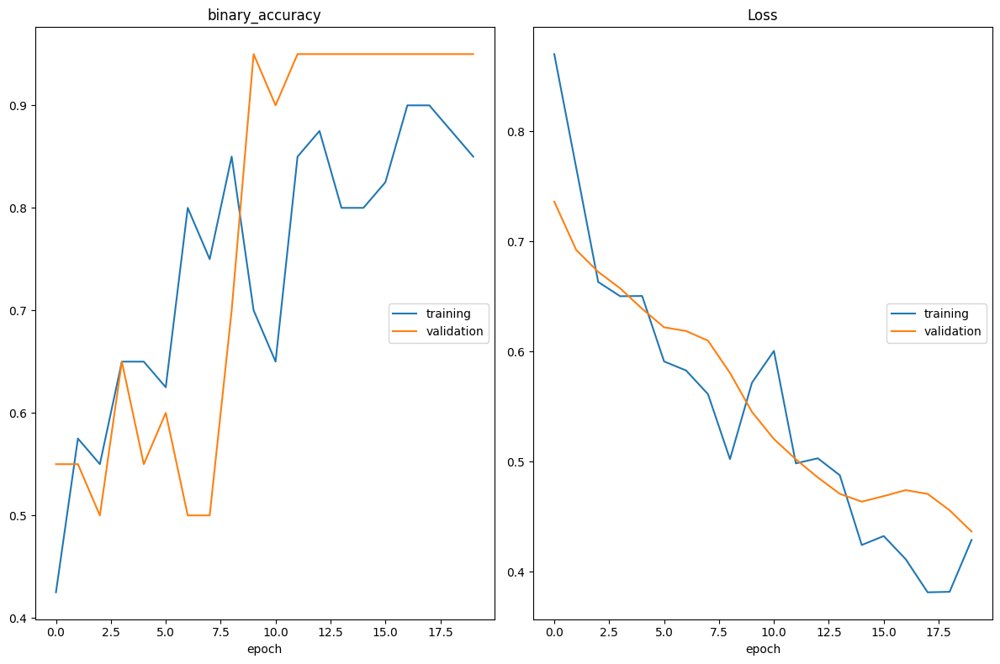

binary_accuracy
	training         	 (min:    0.425, max:    0.900, cur:    0.850)
	validation       	 (min:    0.500, max:    0.950, cur:    0.950)
Loss
	training         	 (min:    0.381, max:    0.870, cur:    0.429)
	validation       	 (min:    0.437, max:    0.736, cur:    0.437)
2/2 [==============================] - 8s 4s/step - loss: 0.4290 - binary_accuracy: 0.8500 - val_loss: 0.4366 - val_binary_accuracy: 0.9500


In [432]:
plot_loss = PlotLossesCallback()
model.fit(train_ds, epochs=20, validation_data=val_ds, callbacks=[plot_loss])

In [433]:
result = model.evaluate(test_ds, return_dict=True)
results.append(result)
result

1/1 [==============================] - 2s 2s/step - loss: 0.4722 - binary_accuracy: 0.9500


{'loss': 0.4722280502319336, 'binary_accuracy': 0.949999988079071}

1/1 [==============================] - 0s 155ms/step


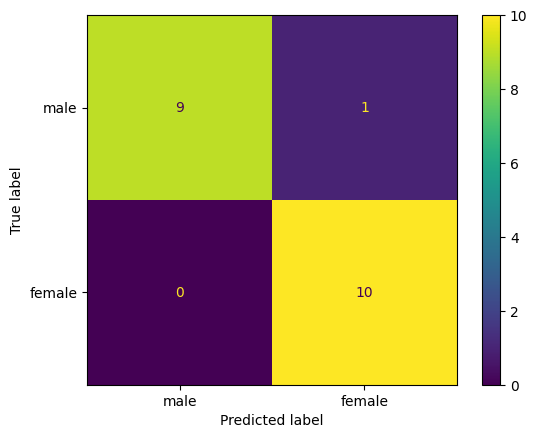

In [434]:
display_confusion_matrix(model, test_ds)

1/1 [==============================] - 0s 187ms/step


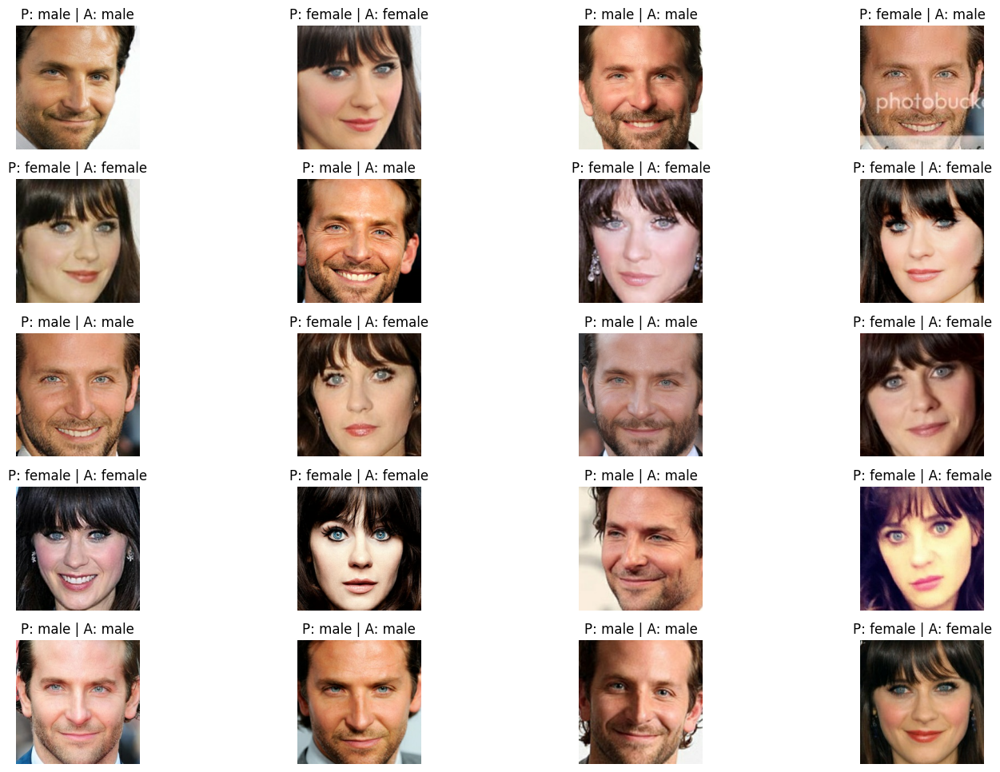

In [435]:
show_predicted_vs_actual(model, test_ds)

### Evaluating results

In [436]:
results

[{'loss': 0.1251193732023239, 'binary_accuracy': 0.949999988079071},
 {'loss': 0.37499338388442993, 'binary_accuracy': 0.8500000238418579},
 {'loss': 0.5145062208175659, 'binary_accuracy': 0.8500000238418579},
 {'loss': 0.4722280502319336, 'binary_accuracy': 0.949999988079071}]

### Fine tuning

To further finetune the model we set it to trainable which means that now all layers and internal models are trainable, meaning the VGG16 model as well.
Because we set `training=False` when we first instantiated the model, the `BatchNormalization` layers inside the VGG16 model are still running in inference mode, meaning they won't update their batch statistics, if they would, the model could unlearn previous learnings.

In [411]:
model.trainable = True
model.summary(show_trainable=True)

Model: "model_35"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 input_84 (InputLayer)       [(None, 224, 224, 3)]     0         Y          
                                                                            
 vgg16 (Functional)          (None, 7, 7, 512)         1471468   Y          
                                                       8                    
                                                                            
 global_average_pooling2d_3  (None, 512)               0         Y          
 3 (GlobalAveragePooling2D)                                                 
                                                                            
 flatten_17 (Flatten)        (None, 512)               0         Y          
                                                                            
 dense_118 (Dense)           (None, 32)                164

In [412]:
model.compile(optimizer=keras.optimizers.legacy.Adam(1e-5),
              loss=keras.losses.BinaryCrossentropy(),
              metrics=[keras.metrics.BinaryAccuracy()])

In [413]:
epochs = 1
model.fit(train_ds, epochs=epochs, validation_data=val_ds)

2/2 [==============================] - 30s 10s/step - loss: 0.1329 - binary_accuracy: 0.9250 - val_loss: 0.0076 - val_binary_accuracy: 1.0000


In [414]:
model.evaluate(test_ds, return_dict=True)

1/1 [==============================] - 4s 4s/step - loss: 0.1251 - binary_accuracy: 0.9500


{'loss': 0.12511935830116272, 'binary_accuracy': 0.949999988079071}

### Breaking the classifier

In [471]:
def load_image(url: str):
    res = request.urlopen(url, timeout=1)
    img = np.asarray(bytearray(res.read()), dtype="uint8")
    img = cv2.imdecode(img, cv2.IMREAD_COLOR)
    img_ = img.copy()
    img_gray = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
    faces = face_classifier.detectMultiScale(
        img_gray,
        scaleFactor=1.2,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    if len(faces) != 1:
        raise Exception(f'{len(faces)} were found. Exactly one needed')

    (x, y, w, h) = faces[0]
    return img[y:y + h, x:x + w]

In [483]:
female = []
male = []

In [484]:
img = load_image(
    'https://i2-prod.dailystar.co.uk/incoming/article26397532.ece/ALTERNATES/s1200b/3_UK-Embrace-Premiere.jpg')
female.append(img)

In [485]:
img = load_image('https://www.channelstv.com/wp-content/uploads/2023/07/Caster-Semenya.jpg')
female.append(img)

In [486]:
img = load_image(
    'https://www.billboard.com/wp-content/uploads/media/conchita-wurst.jpg')
male.append(img)

In [487]:
img = load_image(
    'https://wwd.com/wp-content/uploads/2019/09/shutterstock_editorial_10369347ny.jpg')
male.append(img)

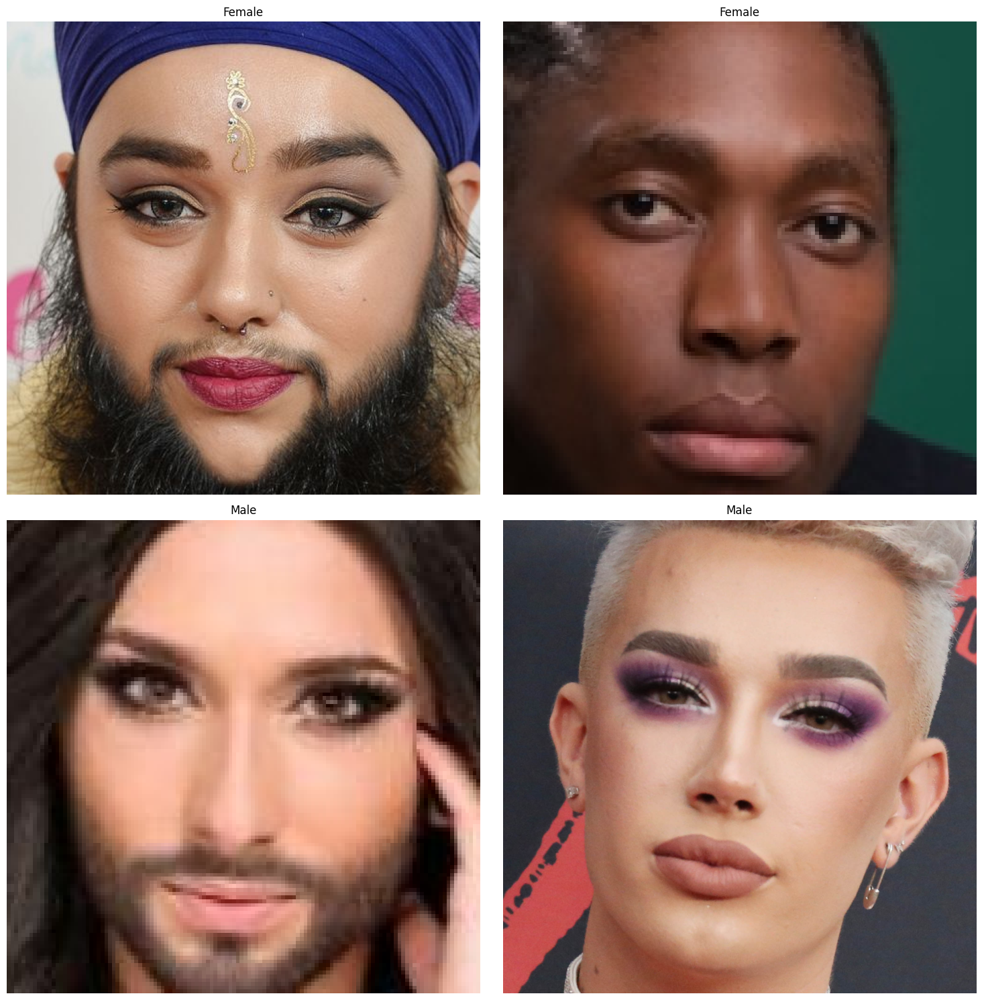

In [489]:
plt.figure(figsize=(15, 15))
for i, image in enumerate(female):
    ax = plt.subplot(2, 2, i + 1)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Female')
for i, image in enumerate(male):
    ax = plt.subplot(2, 2, i + 3)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Male')

In [490]:
# save the cropped images to a folder called training_data
resized_images = np.array([cv2.resize(image, (224, 224)) for image in male + female])
amount_of_images_per_subject = 2
for i, image in enumerate(resized_images):
    sub_folder = 'male' if i < amount_of_images_per_subject else 'female'
    if not os.path.exists(f'breaking_data/{sub_folder}'):
        os.makedirs(f'breaking_data/{sub_folder}')
    cv2.imwrite(
        f'breaking_data/{sub_folder}/image_{i if i < amount_of_images_per_subject else i - amount_of_images_per_subject}.jpg',
        cv2.cvtColor(image, cv2.IMREAD_COLOR))

In [491]:
breaking_data = keras.utils.image_dataset_from_directory(
    'breaking_data',
    image_size=(224, 224),
    class_names=['male', 'female'],
    seed=69)

Found 4 files belonging to 2 classes.


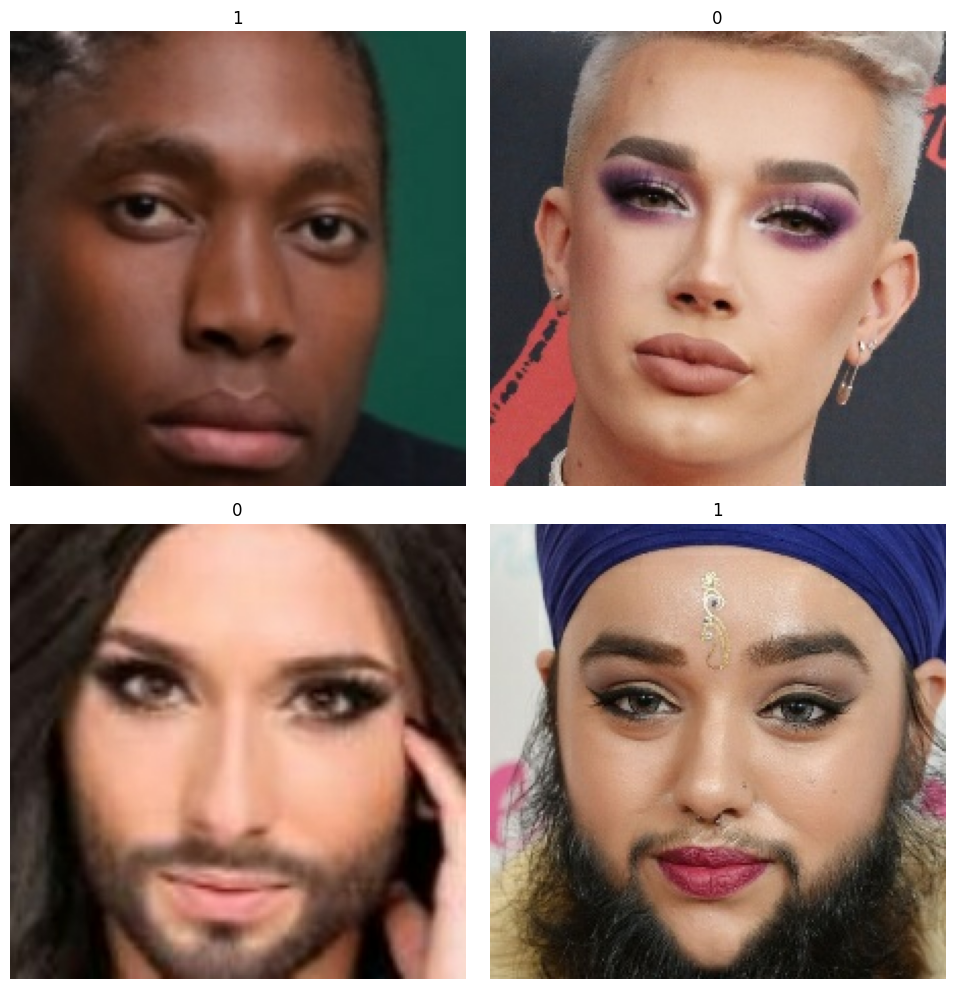

In [493]:
for images, labels in breaking_data.take(1):
    plt.figure(figsize=(10, 10))
    for i, image in enumerate(images):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(image.numpy().astype("int32"))
        plt.title(str(int(labels[i])))
        plt.axis("off")
        plt.tight_layout()

In [494]:
model.evaluate(breaking_data, return_dict=True)

1/1 [==============================] - 1s 703ms/step - loss: 0.7793 - binary_accuracy: 0.5000


{'loss': 0.7793089151382446, 'binary_accuracy': 0.5}

1/1 [==============================] - 0s 244ms/step


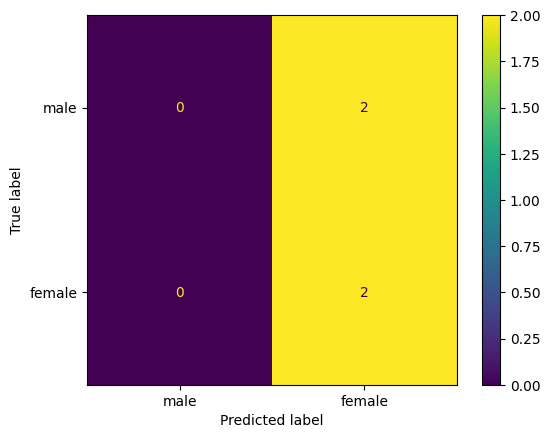

In [495]:
display_confusion_matrix(model, breaking_data)

1
1/1 [==============================] - 0s 140ms/step


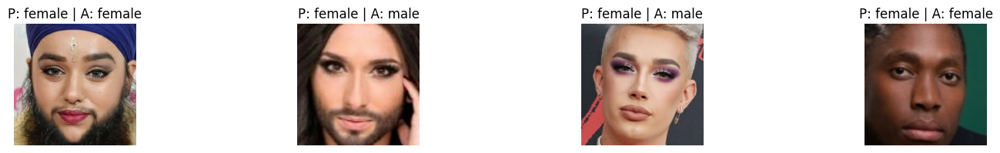

In [498]:
show_predicted_vs_actual(model, breaking_data)

The model clearly struggles to identify males and seems to label men with makeup as female. Surprisingly though, beards don't seem to impact the model a lot and can classify a female with a beard correctly and don't help it classify men with beard when they also wear makeup.
Since this is an incredibly small dataset that is being used to break the classifier and find its wrong biases, these conclusions are mostly hypothesis and would need more data to clarify.